#Week 4 Assignment
##Introduction/Business Problem

This report will examine the optimal site for an law office in Union or Essex Counties, New Jersey.  These counties were chosen as counties with a similar combination of urban and dense suburban municipalities.  The working assumption is a law office will be most successful where the neighborhood is similar to other neighborhoods with a successful bar, but where there is less competition.  There are two county seats in the area being reviewed, Newark and Elizabeth.  Because the Superior Court for each county is located in the county seat, there are generally a higher concentration of law near those sites, so we need to examing whether to adjust for that effect. Newark and Elizabeth both have multiple zip codes/neighborhoods, so we will need to identify the neighborhoods nearest the courthouse.

To do this analysis, we will retrieve location data for all zip codes in the two counties, examine FourSquare data for nearby shops and services, then look for neighborhoods that are similar to other neighborhoods in those counties that have a higher incidence than average of Lawyer venues, but themselves have a low incidence of Lawyer venues.  

#Week 4 Assignment 
##Data

This analysis used ZipExpress to retrieve zip codes by county. 

In [44]:
import pandas as pd 
union = pd.read_html("https://www.getzips.com/cgi-bin/ziplook.exe?What=3&County=union&State=NJ&Submit=Look+It+Up")[2]
essex = pd.read_html("https://www.getzips.com/cgi-bin/ziplook.exe?What=3&County=Essex&State=NJ&Submit=Look+It+Up")[2]
union=union.drop(0)
essex=essex.drop(0)
display(union.head())
display(essex.head())

,0,1,2,3
1,07088,"Vauxhall, NJ",Union,908
2,07901,"Summit, NJ",Union,908
3,07091,"Westfield, NJ",Union,908
4,07083,"Union, NJ",Union,908
5,07090,"Westfield, NJ",Union,908


,0,1,2,3
1,07104,"Newark, NJ",Essex,973
2,07103,"Newark, NJ",Essex,973
3,07107,"Newark, NJ",Essex,973
4,07105,"Newark, NJ",Essex,973
5,07106,"Newark, NJ",Essex,973


The information for the two counties was then joined into a single dataframe.  Column names were added in the new dataframe. 

In [45]:
counties = union
counties=counties.append(essex)
counties.columns=['Zip','City','County','AreaCode']
counties

,Zip,City,County,AreaCode
1,07088,"Vauxhall, NJ",Union,908
2,07901,"Summit, NJ",Union,908
3,07091,"Westfield, NJ",Union,908
4,07083,"Union, NJ",Union,908
5,07090,"Westfield, NJ",Union,908
6,07204,"Roselle Park, NJ",Union,908
7,07203,"Roselle, NJ",Union,908
8,07208,"Elizabeth, NJ",Union,908
9,07206,"Elizabethport, NJ",Union,908
10,07205,"Hillside, NJ",Union,908


I obtained longitude and latitude information by postal code from http://download.geonames.org (http://download.geonames.org/export/zip/US.zip), and read them into a dataframe. 

In [46]:
# The code was removed by Watson Studio for sharing.

,Country,PlaceName,State,County,Latitude,Longitude
Code,,,,,,
99553,US,Akutan,Alaska,Aleutians East,54.1430,-165.7854
99571,US,Cold Bay,Alaska,Aleutians East,55.1858,-162.7211
99583,US,False Pass,Alaska,Aleutians East,54.8542,-163.4113
99612,US,King Cove,Alaska,Aleutians East,55.0628,-162.3056
99661,US,Sand Point,Alaska,Aleutians East,55.3192,-160.4914
99546,US,Adak,Alaska,Aleutians West (CA),51.8740,-176.6340
99547,US,Atka,Alaska,Aleutians West (CA),52.1961,-174.2006
99591,US,Saint George Island,Alaska,Aleutians West (CA),56.5944,-169.6186
99638,US,Nikolski,Alaska,Aleutians West (CA),52.9381,-168.8678


The latitude and longitude were added to the combined dataframe of zip codes by doing a lookup by zip code. 

In [47]:
counties['Latitude'] = list(codes.loc[counties['Zip']]['Latitude'])
counties['Longitude'] = list(codes.loc[counties['Zip']]['Longitude'])
counties['Neighborhood'] = counties['City'] + " " + counties['Zip']
counties.head()


,Zip,City,County,AreaCode,Latitude,Longitude,Neighborhood
1,07088,"Vauxhall, NJ",Union,908,40.7179,-74.2829,"Vauxhall, NJ 07088"
2,07901,"Summit, NJ",Union,908,40.7149,-74.3642,"Summit, NJ 07901"
3,07091,"Westfield, NJ",Union,908,40.6657,-74.2997,"Westfield, NJ 07091"
4,07083,"Union, NJ",Union,908,40.6952,-74.2677,"Union, NJ 07083"
5,07090,"Westfield, NJ",Union,908,40.6479,-74.3451,"Westfield, NJ 07090"


The result is information for 75 localities by zip code.

In [48]:
counties.shape

(75, 7)

In [49]:
counties.sort_values(['Latitude','Longitude'])

,Zip,City,County,AreaCode,Latitude,Longitude,Neighborhood
26,07063,"Plainfield, NJ",Union,908,40.6048,-74.4427,"Plainfield, NJ 07063"
27,07065,"Rahway, NJ",Union,732,40.6087,-74.2819,"Rahway, NJ 07065"
29,07060,"Plainfield, NJ",Union,908,40.6152,-74.4150,"Plainfield, NJ 07060"
25,07066,"Clark, NJ",Union,908,40.6203,-74.3106,"Clark, NJ 07066"
19,07062,"Plainfield, NJ",Union,908,40.6323,-74.3997,"Plainfield, NJ 07062"
30,07036,"Linden, NJ",Union,908,40.6354,-74.2556,"Linden, NJ 07036"
23,07076,"Scotch Plains, NJ",Union,908,40.6379,-74.3682,"Scotch Plains, NJ 07076"
22,07023,"Fanwood, NJ",Union,908,40.6419,-74.3868,"Fanwood, NJ 07023"
5,07090,"Westfield, NJ",Union,908,40.6479,-74.3451,"Westfield, NJ 07090"
9,07206,"Elizabethport, NJ",Union,908,40.6501,-74.1871,"Elizabethport, NJ 07206"


In [50]:
# remove overlapping zip codes
counties.drop([15,17,18,19,27,29], inplace=True)

Installing libraries for further analysis. 

In [51]:
!conda config --show channels

channels:
  - defaults


In [52]:
#install geopy
#!conda install -c conda-forge geopy --yes --debug # uncomment this line if you haven't completed the Foursquare API lab
#!conda install -c conda-forge geopy=1.13.0 --yes --debug # uncomment this line if you haven't completed the Foursquare API lab
#!conda install -c conda geopy --yes --debug # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
print("done")

done


In [53]:
#install folium 
#!conda install -c conda-forge folium=0.4.0 --yes --debug # uncomment this line if you haven't completed the Foursquare API lab
#!pip install folium
import folium # map rendering library
print("done")

done


In [54]:

import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files


import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans


print('Libraries imported.')

Libraries imported.


In [55]:
CLIENT_ID = 'NVKUL15USCVWRI4MZGCL2XY2UZBVYF12D2BSBYENLELS2XQM' # your Foursquare ID
CLIENT_SECRET = '5W11RYKY003KS3RAGXU5JJ004R0D2QRRUONEMEHJIE1XAS5Y' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

#print('Your credentials:')
#print('CLIENT_ID: ' + CLIENT_ID)
#print('CLIENT_SECRET:' + CLIENT_SECRET)

Adding code to look up shops and services near the center of the zip code area. 

In [56]:
CATEGORY = '4d4b7105d754a06378d81259' # Shop & Service
#CATEGORY = '52f2ab2ebcbc57f1066b8b3f' #lawyer
radius = 3000
LIMIT = 300

def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
#        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
#         url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&intent=browse&categoryId={}&client_secret={}&v={}&ll={},{}&limit={}'.format(            
            CLIENT_ID, 
            CATEGORY,
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        display(results)
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Retrieving data specifically for shops and services, category ID 4d4b7105d754a06378d81259, within 300 meters. We are retricting to the most relevant category because of the limit of 100 returned venues by latitude and longitude.   

In [57]:


nj_venues = getNearbyVenues(names=counties['City'] + " " + counties.Zip,
                                   latitudes=counties['Latitude'],
                                   longitudes=counties['Longitude'],
                                   radius=200
                                  )
nj_venues.head()

Vauxhall, NJ 07088


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4a64ca9af964a520b2c61fe3',
   'name': 'Whole Foods Market',
   'location': {'address': '2245 Springfield Ave.',
    'crossStreet': 'Marion St',
    'lat': 40.7170552041893,
    'lng': -74.28654430825806,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.7170552041893,
      'lng': -74.28654430825806}],
    'distance': 321,
    'postalCode': '07088',
    'cc': 'US',
    'city': 'Vauxhall',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['2245 Springfield Ave. (Marion St)',
     'Vauxhall, NJ 07088',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d118951735',
     'name': 'Grocery Store',
     'pluralName': 'Grocery Stores',
     'shortName': 'Grocery Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_',
      'suffix': '.png'},
 

Summit, NJ 07901


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4c0ba0ad7e3fc928c884f582',
   'name': 'Summit Farmers Market',
   'location': {'address': 'DeForest Avenue & Beechwood',
    'crossStreet': 'Summit Bank parking lot',
    'lat': 40.71871051456713,
    'lng': -74.35879602084398,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.71871051456713,
      'lng': -74.35879602084398}],
    'distance': 622,
    'postalCode': '07901',
    'cc': 'US',
    'city': 'Summit',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['DeForest Avenue & Beechwood (Summit Bank parking lot)',
     'Summit, NJ 07901',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d1fa941735',
     'name': 'Farmers Market',
     'pluralName': 'Farmers Markets',
     'shortName': "Farmer's Market",
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/sho

Westfield, NJ 07091


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '53f66cd7498e48ede4a05746',
   'name': 'Pastosa Ravioli',
   'location': {'lat': 40.65470460951825,
    'lng': -74.30224675896211,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.65470460951825,
      'lng': -74.30224675896211}],
    'distance': 1242,
    'cc': 'US',
    'city': 'Cranford',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['Cranford, NJ', 'United States']},
   'categories': [{'id': '4bf58dd8d48988d1f5941735',
     'name': 'Gourmet Shop',
     'pluralName': 'Gourmet Shops',
     'shortName': 'Gourmet',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_gourmet_',
      'suffix': '.png'},
     'primary': True}],
   'delivery': {'id': '1521336',
    'url': 'https://www.grubhub.com/restaurant/pastosa-ravioli-200-south-avenue-east-cranford/1521336?af

Union, NJ 07083


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4dd7f3511838b8561cf41b90',
   'name': "Aarti's world discount liquors",
   'location': {'address': '1675 US Highway 22 W',
    'lat': 40.696937768672974,
    'lng': -74.25408100293023,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.696937768672974,
      'lng': -74.25408100293023}],
    'distance': 1165,
    'postalCode': '07083',
    'cc': 'US',
    'city': 'Union',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['1675 US Highway 22 W',
     'Union, NJ 07083',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d186941735',
     'name': 'Liquor Store',
     'pluralName': 'Liquor Stores',
     'shortName': 'Liquor Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_liquor_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'c

Westfield, NJ 07090


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4a7a1177f964a52061e81fe3',
   'name': "Trader Joe's",
   'location': {'address': '155 Elm St',
    'crossStreet': 'E Broad St',
    'lat': 40.65196785125359,
    'lng': -74.34981820198048,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.65196785125359,
      'lng': -74.34981820198048},
     {'label': 'entrance', 'lat': 40.652465, 'lng': -74.34978}],
    'distance': 603,
    'postalCode': '07090',
    'cc': 'US',
    'city': 'Westfield',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['155 Elm St (E Broad St)',
     'Westfield, NJ 07090',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d118951735',
     'name': 'Grocery Store',
     'pluralName': 'Grocery Stores',
     'shortName': 'Grocery Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/

Roselle Park, NJ 07204


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4c2b79392219c92870a3a448',
   'name': 'Family Dollar',
   'location': {'address': '7 E Westfield Ave',
    'lat': 40.66182572724883,
    'lng': -74.26336773236987,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.66182572724883,
      'lng': -74.26336773236987}],
    'distance': 476,
    'postalCode': '07204',
    'cc': 'US',
    'city': 'Roselle Park',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['7 E Westfield Ave',
     'Roselle Park, NJ 07204',
     'United States']},
   'categories': [{'id': '52dea92d3cf9994f4e043dbb',
     'name': 'Discount Store',
     'pluralName': 'Discount Stores',
     'shortName': 'Discount Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/discountstore_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count

Roselle, NJ 07203


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4b2fc3aef964a5206aef24e3',
   'name': 'Walgreens',
   'location': {'address': '22 E Saint Georges Ave',
    'lat': 40.63769321086111,
    'lng': -74.26343679428106,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.63769321086111,
      'lng': -74.26343679428106},
     {'label': 'entrance', 'lat': 40.637739, 'lng': -74.263703}],
    'distance': 1716,
    'postalCode': '07036',
    'cc': 'US',
    'city': 'Linden',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['22 E Saint Georges Ave',
     'Linden, NJ 07036',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d10f951735',
     'name': 'Pharmacy',
     'pluralName': 'Pharmacies',
     'shortName': 'Pharmacy',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/pharmacy_',
      'suffix': '.png'},
     '

Elizabeth, NJ 07208


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '576c8b76498e72c8c44c199b',
   'name': 'Food Bazaar Supermarket',
   'location': {'address': '211 Elmora Ave',
    'crossStreet': 'Grand St',
    'lat': 40.664499859485005,
    'lng': -74.23184501874606,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.664499859485005,
      'lng': -74.23184501874606}],
    'distance': 1318,
    'postalCode': '07202',
    'cc': 'US',
    'city': 'Elizabeth',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['211 Elmora Ave (Grand St)',
     'Elizabeth, NJ 07202',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d118951735',
     'name': 'Grocery Store',
     'pluralName': 'Grocery Stores',
     'shortName': 'Grocery Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_',
      'suffix': '.png'},
     

Elizabethport, NJ 07206


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4a9ae129f964a520513320e3',
   'name': 'Neiman Marcus Last Call',
   'location': {'address': '651 Kapkowski Rd Ste 200',
    'crossStreet': 'at Jersey Gardens Blvd',
    'lat': 40.66012227451116,
    'lng': -74.17286573075158,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.66012227451116,
      'lng': -74.17286573075158}],
    'distance': 1640,
    'postalCode': '07201',
    'cc': 'US',
    'city': 'Elizabeth',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['651 Kapkowski Rd Ste 200 (at Jersey Gardens Blvd)',
     'Elizabeth, NJ 07201',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d103951735',
     'name': 'Clothing Store',
     'pluralName': 'Clothing Stores',
     'shortName': 'Apparel',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/appa

Hillside, NJ 07205


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '50a28a5ee4b0fffeb79ab276',
   'name': 'Walgreens',
   'location': {'address': '1311 Morris Ave',
    'lat': 40.68792412351218,
    'lng': -74.24233145554348,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.68792412351218,
      'lng': -74.24233145554348}],
    'distance': 1555,
    'postalCode': '07083',
    'cc': 'US',
    'city': 'Union',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['1311 Morris Ave',
     'Union, NJ 07083',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d10f951735',
     'name': 'Pharmacy',
     'pluralName': 'Pharmacies',
     'shortName': 'Pharmacy',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/pharmacy_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count': 0, 'groups': []}},
  'referralId': 'e-0-

Elizabeth, NJ 07207


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '5154d02ce4b0913f3b549891',
   'name': 'Wawa',
   'location': {'address': '595 Spring St',
    'lat': 40.672943,
    'lng': -74.199621,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.672943,
      'lng': -74.199621}],
    'distance': 1366,
    'postalCode': '07201',
    'cc': 'US',
    'city': 'Elizabeth',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['595 Spring St',
     'Elizabeth, NJ 07201',
     'United States']},
   'categories': [{'id': '4d954b0ea243a5684a65b473',
     'name': 'Convenience Store',
     'pluralName': 'Convenience Stores',
     'shortName': 'Convenience Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/conveniencestore_',
      'suffix': '.png'},
     'primary': True}],
   'delivery': {'id': '1337923',
    'url': 'https://www.grubh

Mountainside, NJ 07092


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4c38a98a1e06d13ab01c783e',
   'name': 'Vine Republic Mountainside',
   'location': {'address': '1267 US Highway 22',
    'crossStreet': 'Mountain Ave',
    'lat': 40.67331417949738,
    'lng': -74.35030727747005,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.67331417949738,
      'lng': -74.35030727747005}],
    'distance': 920,
    'postalCode': '07092',
    'cc': 'US',
    'city': 'Mountainside',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['1267 US Highway 22 (Mountain Ave)',
     'Mountainside, NJ 07092',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d186941735',
     'name': 'Liquor Store',
     'pluralName': 'Liquor Stores',
     'shortName': 'Liquor Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_liquor_',
      'suffi

Berkeley Heights, NJ 07922


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '53887829498e1819184b9d47',
   'name': 'Central Farmers Market',
   'location': {'address': '598 Central Ave',
    'crossStreet': 'Chanlon Rd',
    'lat': 40.6972078760738,
    'lng': -74.40536410873142,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.6972078760738,
      'lng': -74.40536410873142}],
    'distance': 3477,
    'postalCode': '07974',
    'cc': 'US',
    'city': 'New Providence',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['598 Central Ave (Chanlon Rd)',
     'New Providence, NJ 07974',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d1fa941735',
     'name': 'Farmers Market',
     'pluralName': 'Farmers Markets',
     'shortName': "Farmer's Market",
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_farmersmarket_',
      'su

Summit, NJ 07902


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4c0ba0ad7e3fc928c884f582',
   'name': 'Summit Farmers Market',
   'location': {'address': 'DeForest Avenue & Beechwood',
    'crossStreet': 'Summit Bank parking lot',
    'lat': 40.71871051456713,
    'lng': -74.35879602084398,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.71871051456713,
      'lng': -74.35879602084398}],
    'distance': 606,
    'postalCode': '07901',
    'cc': 'US',
    'city': 'Summit',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['DeForest Avenue & Beechwood (Summit Bank parking lot)',
     'Summit, NJ 07901',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d1fa941735',
     'name': 'Farmers Market',
     'pluralName': 'Farmers Markets',
     'shortName': "Farmer's Market",
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/sho

New Providence, NJ 07974


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '53887829498e1819184b9d47',
   'name': 'Central Farmers Market',
   'location': {'address': '598 Central Ave',
    'crossStreet': 'Chanlon Rd',
    'lat': 40.6972078760738,
    'lng': -74.40536410873142,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.6972078760738,
      'lng': -74.40536410873142}],
    'distance': 439,
    'postalCode': '07974',
    'cc': 'US',
    'city': 'New Providence',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['598 Central Ave (Chanlon Rd)',
     'New Providence, NJ 07974',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d1fa941735',
     'name': 'Farmers Market',
     'pluralName': 'Farmers Markets',
     'shortName': "Farmer's Market",
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_farmersmarket_',
      'suf

Kenilworth, NJ 07033


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4b50efc0f964a520783927e3',
   'name': 'Total Wine & More',
   'location': {'address': '950 Springfield Rd',
    'crossStreet': 'at Route 22 E',
    'lat': 40.6886596,
    'lng': -74.2992839,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.6886596,
      'lng': -74.2992839}],
    'distance': 1479,
    'postalCode': '07083',
    'cc': 'US',
    'city': 'Union',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['950 Springfield Rd (at Route 22 E)',
     'Union, NJ 07083',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d119951735',
     'name': 'Wine Shop',
     'pluralName': 'Wine Shops',
     'shortName': 'Wine Shop',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_wineshop_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'cou

Plainfield, NJ 07061


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '53f66cd7498e48ede4a05746',
   'name': 'Pastosa Ravioli',
   'location': {'lat': 40.65470460951825,
    'lng': -74.30224675896211,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.65470460951825,
      'lng': -74.30224675896211}],
    'distance': 1242,
    'cc': 'US',
    'city': 'Cranford',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['Cranford, NJ', 'United States']},
   'categories': [{'id': '4bf58dd8d48988d1f5941735',
     'name': 'Gourmet Shop',
     'pluralName': 'Gourmet Shops',
     'shortName': 'Gourmet',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_gourmet_',
      'suffix': '.png'},
     'primary': True}],
   'delivery': {'id': '1521336',
    'url': 'https://www.grubhub.com/restaurant/pastosa-ravioli-200-south-avenue-east-cranford/1521336?af

Fanwood, NJ 07023


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4c01710df7ab0f47542016b6',
   'name': 'Fanwood Liquors',
   'location': {'address': '61 South Ave',
    'lat': 40.63683427151687,
    'lng': -74.39028739889774,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.63683427151687,
      'lng': -74.39028739889774},
     {'label': 'entrance', 'lat': 40.636924, 'lng': -74.389976}],
    'distance': 636,
    'postalCode': '07023',
    'cc': 'US',
    'city': 'Fanwood',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['61 South Ave',
     'Fanwood, NJ 07023',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d186941735',
     'name': 'Liquor Store',
     'pluralName': 'Liquor Stores',
     'shortName': 'Liquor Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_liquor_',
      'suffix': '.png'},
     

Scotch Plains, NJ 07076


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4bbe1f331416a59301adf33c',
   'name': 'Tom the Green Grocer',
   'location': {'address': '2305 S Ave',
    'lat': 40.64609547136653,
    'lng': -74.36968374026517,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.64609547136653,
      'lng': -74.36968374026517},
     {'label': 'entrance', 'lat': 40.646084, 'lng': -74.369721}],
    'distance': 920,
    'postalCode': '07076',
    'cc': 'US',
    'city': 'Scotch Plains',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['2305 S Ave',
     'Scotch Plains, NJ 07076',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d1f5941735',
     'name': 'Gourmet Shop',
     'pluralName': 'Gourmet Shops',
     'shortName': 'Gourmet',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_gourmet_',
      'suffix': '.png

Springfield, NJ 07081


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4a8efcbcf964a520791320e3',
   'name': 'Wine Library',
   'location': {'address': '586 Morris Ave # NJ-124',
    'crossStreet': 'Millburn Ave',
    'lat': 40.71700360910418,
    'lng': -74.32459893837341,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.71700360910418,
      'lng': -74.32459893837341}],
    'distance': 1733,
    'postalCode': '07081',
    'cc': 'US',
    'city': 'Springfield',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['586 Morris Ave # NJ-124 (Millburn Ave)',
     'Springfield, NJ 07081',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d119951735',
     'name': 'Wine Shop',
     'pluralName': 'Wine Shops',
     'shortName': 'Wine Shop',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_wineshop_',
      'suffix': '.png'},

Clark, NJ 07066


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '5585b8c8498e080169b0fee4',
   'name': 'Clark Commons',
   'location': {'lat': 40.63134999277488,
    'lng': -74.30490327899506,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.63134999277488,
      'lng': -74.30490327899506}],
    'distance': 1320,
    'cc': 'US',
    'city': 'Clark',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['Clark, NJ', 'United States']},
   'categories': [{'id': '5744ccdfe4b0c0459246b4dc',
     'name': 'Shopping Plaza',
     'pluralName': 'Shopping Plazas',
     'shortName': 'Shopping Plaza',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/mall_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count': 0, 'groups': []}},
  'referralId': 'e-0-5585b8c8498e080169b0fee4-0'},
 {'reasons': {'count': 0,
   'items': [{'summary'

Plainfield, NJ 07063


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '5262d3dc498e25edb0c18b57',
   'name': 'Costco',
   'location': {'address': '1290 U.S. 22',
    'crossStreet': 'Between Rich and West End',
    'lat': 40.611939540347215,
    'lng': -74.45927109210693,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.611939540347215,
      'lng': -74.45927109210693}],
    'distance': 1610,
    'postalCode': '07060',
    'cc': 'US',
    'city': 'North Plainfield',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['1290 U.S. 22 (Between Rich and West End)',
     'North Plainfield, NJ 07060',
     'United States']},
   'categories': [{'id': '52e816a6bcbc57f1066b7a54',
     'name': 'Warehouse Store',
     'pluralName': 'Warehouse Stores',
     'shortName': 'Warehouse Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/default_',
  

Cranford, NJ 07016


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '53f66cd7498e48ede4a05746',
   'name': 'Pastosa Ravioli',
   'location': {'lat': 40.65470460951825,
    'lng': -74.30224675896211,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.65470460951825,
      'lng': -74.30224675896211}],
    'distance': 301,
    'cc': 'US',
    'city': 'Cranford',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['Cranford, NJ', 'United States']},
   'categories': [{'id': '4bf58dd8d48988d1f5941735',
     'name': 'Gourmet Shop',
     'pluralName': 'Gourmet Shops',
     'shortName': 'Gourmet',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_gourmet_',
      'suffix': '.png'},
     'primary': True}],
   'delivery': {'id': '1521336',
    'url': 'https://www.grubhub.com/restaurant/pastosa-ravioli-200-south-avenue-east-cranford/1521336?aff

Linden, NJ 07036


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4b2fc3aef964a5206aef24e3',
   'name': 'Walgreens',
   'location': {'address': '22 E Saint Georges Ave',
    'lat': 40.63769321086111,
    'lng': -74.26343679428106,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.63769321086111,
      'lng': -74.26343679428106},
     {'label': 'entrance', 'lat': 40.637739, 'lng': -74.263703}],
    'distance': 709,
    'postalCode': '07036',
    'cc': 'US',
    'city': 'Linden',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['22 E Saint Georges Ave',
     'Linden, NJ 07036',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d10f951735',
     'name': 'Pharmacy',
     'pluralName': 'Pharmacies',
     'shortName': 'Pharmacy',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/pharmacy_',
      'suffix': '.png'},
     'p

Newark, NJ 07104


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '576c8933498e50ff83219e8b',
   'name': 'Food World SuperFresh',
   'location': {'address': '115 Belmont Ave',
    'lat': 40.778945639487205,
    'lng': -74.18409422117792,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.778945639487205,
      'lng': -74.18409422117792}],
    'distance': 1861,
    'postalCode': '07109',
    'cc': 'US',
    'city': 'Belleville',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['115 Belmont Ave',
     'Belleville, NJ 07109',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d118951735',
     'name': 'Grocery Store',
     'pluralName': 'Grocery Stores',
     'shortName': 'Grocery Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count'

Newark, NJ 07103


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '560c4636498e4f7e6e4562f1',
   'name': 'ShopRite',
   'location': {'address': '206 Springfield Ave',
    'lat': 40.736425832850784,
    'lng': -74.18627919865526,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.736425832850784,
      'lng': -74.18627919865526}],
    'distance': 856,
    'postalCode': '07103',
    'cc': 'US',
    'city': 'Newark',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['206 Springfield Ave',
     'Newark, NJ 07103',
     'United States']},
   'categories': [{'id': '52f2ab2ebcbc57f1066b8b46',
     'name': 'Supermarket',
     'pluralName': 'Supermarkets',
     'shortName': 'Supermarket',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count': 0, 'groups': []}},

Newark, NJ 07107


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '576c8933498e50ff83219e8b',
   'name': 'Food World SuperFresh',
   'location': {'address': '115 Belmont Ave',
    'lat': 40.778945639487205,
    'lng': -74.18409422117792,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.778945639487205,
      'lng': -74.18409422117792}],
    'distance': 2060,
    'postalCode': '07109',
    'cc': 'US',
    'city': 'Belleville',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['115 Belmont Ave',
     'Belleville, NJ 07109',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d118951735',
     'name': 'Grocery Store',
     'pluralName': 'Grocery Stores',
     'shortName': 'Grocery Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count'

Newark, NJ 07105


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4c2bacbcb34ad13a6b29eace',
   'name': "Seabra's Supermarket",
   'location': {'address': '260 Lafayette St',
    'crossStreet': 'Btw Madison & Monroe',
    'lat': 40.728272218932446,
    'lng': -74.16103214776868,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.728272218932446,
      'lng': -74.16103214776868},
     {'label': 'entrance', 'lat': 40.728087, 'lng': -74.161171}],
    'distance': 419,
    'postalCode': '07105',
    'cc': 'US',
    'neighborhood': 'North Ironbound',
    'city': 'Newark',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['260 Lafayette St (Btw Madison & Monroe)',
     'Newark, NJ 07105',
     'United States']},
   'categories': [{'id': '52f2ab2ebcbc57f1066b8b46',
     'name': 'Supermarket',
     'pluralName': 'Supermarkets',
     'shortName': 'Supermarket',


Newark, NJ 07106


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4ce8133ae1eeb60c2507a1ae',
   'name': 'Home Liquors',
   'location': {'address': 'Springfield Ave',
    'crossStreet': 'S 16Th St',
    'lat': 40.731042371810695,
    'lng': -74.21082878218674,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.731042371810695,
      'lng': -74.21082878218674},
     {'label': 'entrance', 'lat': 40.730345, 'lng': -74.209952}],
    'distance': 2202,
    'postalCode': '07103',
    'cc': 'US',
    'city': 'Newark',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['Springfield Ave (S 16Th St)',
     'Newark, NJ 07103',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d186941735',
     'name': 'Liquor Store',
     'pluralName': 'Liquor Stores',
     'shortName': 'Liquor Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/sho

West Orange, NJ 07052


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4b3d190cf964a520e08d25e3',
   'name': 'Total Wine & More',
   'location': {'address': '495 Prospect Ave',
    'crossStreet': 'in Essex Green Shopping Center',
    'lat': 40.7934975,
    'lng': -74.2564449,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.7934975,
      'lng': -74.2564449}],
    'distance': 846,
    'postalCode': '07052',
    'cc': 'US',
    'city': 'West Orange',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['495 Prospect Ave (in Essex Green Shopping Center)',
     'West Orange, NJ 07052',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d119951735',
     'name': 'Wine Shop',
     'pluralName': 'Wine Shops',
     'shortName': 'Wine Shop',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_wineshop_',
      'suffix': '.png'},
 

Roseland, NJ 07068


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4b23aeb3f964a520085824e3',
   'name': "Fairchild's Market",
   'location': {'address': '171 Eagle Rock Ave',
    'lat': 40.82058463847111,
    'lng': -74.29421400121501,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.82058463847111,
      'lng': -74.29421400121501},
     {'label': 'entrance', 'lat': 40.820656, 'lng': -74.294236}],
    'distance': 883,
    'postalCode': '07068',
    'cc': 'US',
    'city': 'Roseland',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['171 Eagle Rock Ave',
     'Roseland, NJ 07068',
     'United States']},
   'categories': [{'id': '50be8ee891d4fa8dcc7199a7',
     'name': 'Market',
     'pluralName': 'Markets',
     'shortName': 'Market',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/market_',
      'suffix': '.png'},
     'prima

Orange, NJ 07050


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4bf0560cc8d920a1fcb49430',
   'name': 'Walgreens',
   'location': {'address': '240-250 Central Ave',
    'lat': 40.7650714,
    'lng': -74.2329769,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.7650714,
      'lng': -74.2329769}],
    'distance': 506,
    'postalCode': '07050',
    'cc': 'US',
    'city': 'Orange',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['240-250 Central Ave',
     'Orange, NJ 07050',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d10f951735',
     'name': 'Pharmacy',
     'pluralName': 'Pharmacies',
     'shortName': 'Pharmacy',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/pharmacy_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count': 0, 'groups': []}},
  'referralId': 'e-0-4bf0560cc8d920a1fcb

Orange, NJ 07051


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4b3d190cf964a520e08d25e3',
   'name': 'Total Wine & More',
   'location': {'address': '495 Prospect Ave',
    'crossStreet': 'in Essex Green Shopping Center',
    'lat': 40.7934975,
    'lng': -74.2564449,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.7934975,
      'lng': -74.2564449}],
    'distance': 966,
    'postalCode': '07052',
    'cc': 'US',
    'city': 'West Orange',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['495 Prospect Ave (in Essex Green Shopping Center)',
     'West Orange, NJ 07052',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d119951735',
     'name': 'Wine Shop',
     'pluralName': 'Wine Shops',
     'shortName': 'Wine Shop',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_wineshop_',
      'suffix': '.png'},
 

Short Hills, NJ 07078


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4a8efcbcf964a520791320e3',
   'name': 'Wine Library',
   'location': {'address': '586 Morris Ave # NJ-124',
    'crossStreet': 'Millburn Ave',
    'lat': 40.71700360910418,
    'lng': -74.32459893837341,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.71700360910418,
      'lng': -74.32459893837341}],
    'distance': 2213,
    'postalCode': '07081',
    'cc': 'US',
    'city': 'Springfield',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['586 Morris Ave # NJ-124 (Millburn Ave)',
     'Springfield, NJ 07081',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d119951735',
     'name': 'Wine Shop',
     'pluralName': 'Wine Shops',
     'shortName': 'Wine Shop',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_wineshop_',
      'suffix': '.png'},

Newark, NJ 07101


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4ce8133ae1eeb60c2507a1ae',
   'name': 'Home Liquors',
   'location': {'address': 'Springfield Ave',
    'crossStreet': 'S 16Th St',
    'lat': 40.731042371810695,
    'lng': -74.21082878218674,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.731042371810695,
      'lng': -74.21082878218674},
     {'label': 'entrance', 'lat': 40.730345, 'lng': -74.209952}],
    'distance': 1328,
    'postalCode': '07103',
    'cc': 'US',
    'city': 'Newark',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['Springfield Ave (S 16Th St)',
     'Newark, NJ 07103',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d186941735',
     'name': 'Liquor Store',
     'pluralName': 'Liquor Stores',
     'shortName': 'Liquor Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/sho

Newark, NJ 07102


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4c562157973fc9287c5277c8',
   'name': 'Barnabas Health Hockey House',
   'location': {'address': '165 Mulberry St',
    'crossStreet': 'at Lafayette St',
    'lat': 40.73268473501239,
    'lng': -74.17170806516359,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.73268473501239,
      'lng': -74.17170806516359}],
    'distance': 411,
    'postalCode': '07102',
    'cc': 'US',
    'city': 'Newark',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['165 Mulberry St (at Lafayette St)',
     'Newark, NJ 07102',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d1f2941735',
     'name': 'Sporting Goods Shop',
     'pluralName': 'Sporting Goods Shops',
     'shortName': 'Sporting Goods',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_',
  

Newark, NJ 07198


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4b3d190cf964a520e08d25e3',
   'name': 'Total Wine & More',
   'location': {'address': '495 Prospect Ave',
    'crossStreet': 'in Essex Green Shopping Center',
    'lat': 40.7934975,
    'lng': -74.2564449,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.7934975,
      'lng': -74.2564449}],
    'distance': 966,
    'postalCode': '07052',
    'cc': 'US',
    'city': 'West Orange',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['495 Prospect Ave (in Essex Green Shopping Center)',
     'West Orange, NJ 07052',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d119951735',
     'name': 'Wine Shop',
     'pluralName': 'Wine Shops',
     'shortName': 'Wine Shop',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_wineshop_',
      'suffix': '.png'},
 

South Orange, NJ 07079


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '51eaa953498e0c4a2fcd1080',
   'name': '7-Eleven',
   'location': {'address': '60 Valley St',
    'lat': 40.7447083,
    'lng': -74.2591943,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.7447083,
      'lng': -74.2591943}],
    'distance': 245,
    'postalCode': '07079',
    'cc': 'US',
    'city': 'South Orange',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['60 Valley St',
     'South Orange, NJ 07079',
     'United States']},
   'categories': [{'id': '4d954b0ea243a5684a65b473',
     'name': 'Convenience Store',
     'pluralName': 'Convenience Stores',
     'shortName': 'Convenience Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/conveniencestore_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count': 0, 'groups': []}},
  'referr

Newark, NJ 07184


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4b3d190cf964a520e08d25e3',
   'name': 'Total Wine & More',
   'location': {'address': '495 Prospect Ave',
    'crossStreet': 'in Essex Green Shopping Center',
    'lat': 40.7934975,
    'lng': -74.2564449,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.7934975,
      'lng': -74.2564449}],
    'distance': 966,
    'postalCode': '07052',
    'cc': 'US',
    'city': 'West Orange',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['495 Prospect Ave (in Essex Green Shopping Center)',
     'West Orange, NJ 07052',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d119951735',
     'name': 'Wine Shop',
     'pluralName': 'Wine Shops',
     'shortName': 'Wine Shop',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_wineshop_',
      'suffix': '.png'},
 

Newark, NJ 07191


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4b3d190cf964a520e08d25e3',
   'name': 'Total Wine & More',
   'location': {'address': '495 Prospect Ave',
    'crossStreet': 'in Essex Green Shopping Center',
    'lat': 40.7934975,
    'lng': -74.2564449,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.7934975,
      'lng': -74.2564449}],
    'distance': 966,
    'postalCode': '07052',
    'cc': 'US',
    'city': 'West Orange',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['495 Prospect Ave (in Essex Green Shopping Center)',
     'West Orange, NJ 07052',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d119951735',
     'name': 'Wine Shop',
     'pluralName': 'Wine Shops',
     'shortName': 'Wine Shop',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_wineshop_',
      'suffix': '.png'},
 

Newark, NJ 07189


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4b3d190cf964a520e08d25e3',
   'name': 'Total Wine & More',
   'location': {'address': '495 Prospect Ave',
    'crossStreet': 'in Essex Green Shopping Center',
    'lat': 40.7934975,
    'lng': -74.2564449,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.7934975,
      'lng': -74.2564449}],
    'distance': 966,
    'postalCode': '07052',
    'cc': 'US',
    'city': 'West Orange',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['495 Prospect Ave (in Essex Green Shopping Center)',
     'West Orange, NJ 07052',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d119951735',
     'name': 'Wine Shop',
     'pluralName': 'Wine Shops',
     'shortName': 'Wine Shop',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_wineshop_',
      'suffix': '.png'},
 

Newark, NJ 07114


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '55b19588498e095bff38d3e7',
   'name': 'Railroad Cigars',
   'location': {'address': '188 Pulaski St',
    'crossStreet': 'Clifford Street',
    'lat': 40.7187162595018,
    'lng': -74.16051204618272,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.7187162595018,
      'lng': -74.16051204618272},
     {'label': 'entrance', 'lat': 40.718775, 'lng': -74.160511}],
    'distance': 2681,
    'postalCode': '07105',
    'cc': 'US',
    'city': 'Newark',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['188 Pulaski St (Clifford Street)',
     'Newark, NJ 07105',
     'United States']},
   'categories': [{'id': '5453de49498eade8af355881',
     'name': 'Business Service',
     'pluralName': 'Business Services',
     'shortName': 'Business Services',
     'icon': {'prefix': 'https://ss3.4sqi.net

Nutley, NJ 07110


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '509a7419e4b00d5fa6c13fb9',
   'name': "Trader Joe's",
   'location': {'address': '259 Allwood Road',
    'crossStreet': 'Route 3 West',
    'lat': 40.836619817591355,
    'lng': -74.15161159758628,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.836619817591355,
      'lng': -74.15161159758628}],
    'distance': 2108,
    'postalCode': '07012',
    'cc': 'US',
    'city': 'Clifton',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['259 Allwood Road (Route 3 West)',
     'Clifton, NJ 07012',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d118951735',
     'name': 'Grocery Store',
     'pluralName': 'Grocery Stores',
     'shortName': 'Grocery Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_',
      'suffix': '.png'},
     'pr

Belleville, NJ 07109


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '572baefa498e58614562b6c3',
   'name': 'Super Fresh " Food World "',
   'location': {'address': '19 Belleville Ave',
    'lat': 40.79707880472702,
    'lng': -74.17965870121269,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.79707880472702,
      'lng': -74.17965870121269}],
    'distance': 1422,
    'postalCode': '07003',
    'cc': 'US',
    'city': 'Bloomfield',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['19 Belleville Ave',
     'Bloomfield, NJ 07003',
     'United States']},
   'categories': [{'id': '52f2ab2ebcbc57f1066b8b46',
     'name': 'Supermarket',
     'pluralName': 'Supermarkets',
     'shortName': 'Supermarket',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count

Newark, NJ 07108


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4ce8133ae1eeb60c2507a1ae',
   'name': 'Home Liquors',
   'location': {'address': 'Springfield Ave',
    'crossStreet': 'S 16Th St',
    'lat': 40.731042371810695,
    'lng': -74.21082878218674,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.731042371810695,
      'lng': -74.21082878218674},
     {'label': 'entrance', 'lat': 40.730345, 'lng': -74.209952}],
    'distance': 1142,
    'postalCode': '07103',
    'cc': 'US',
    'city': 'Newark',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['Springfield Ave (S 16Th St)',
     'Newark, NJ 07103',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d186941735',
     'name': 'Liquor Store',
     'pluralName': 'Liquor Stores',
     'shortName': 'Liquor Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/sho

Irvington, NJ 07111


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '576c8bafcd109214748d89dd',
   'name': 'SuperFresh Supermarket',
   'location': {'address': '471 Lyons Ave',
    'lat': 40.716162275995494,
    'lng': -74.22335722324122,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.716162275995494,
      'lng': -74.22335722324122}],
    'distance': 1293,
    'postalCode': '07111',
    'cc': 'US',
    'city': 'Irvington',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['471 Lyons Ave',
     'Irvington, NJ 07111',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d118951735',
     'name': 'Grocery Store',
     'pluralName': 'Grocery Stores',
     'shortName': 'Grocery Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count': 0, 

Newark, NJ 07112


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '576c8bafcd109214748d89dd',
   'name': 'SuperFresh Supermarket',
   'location': {'address': '471 Lyons Ave',
    'lat': 40.716162275995494,
    'lng': -74.22335722324122,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.716162275995494,
      'lng': -74.22335722324122}],
    'distance': 1057,
    'postalCode': '07111',
    'cc': 'US',
    'city': 'Irvington',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['471 Lyons Ave',
     'Irvington, NJ 07111',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d118951735',
     'name': 'Grocery Store',
     'pluralName': 'Grocery Stores',
     'shortName': 'Grocery Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count': 0, 

Verona, NJ 07044


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4be2020218ab2d7f0dab5cb4',
   'name': 'Petco',
   'location': {'address': '339 Pompton Ave.',
    'crossStreet': 'at Claridge Drive',
    'lat': 40.83555611060526,
    'lng': -74.22545880898481,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.83555611060526,
      'lng': -74.22545880898481}],
    'distance': 1516,
    'postalCode': '07044',
    'cc': 'US',
    'city': 'Verona',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['339 Pompton Ave. (at Claridge Drive)',
     'Verona, NJ 07044',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d100951735',
     'name': 'Pet Store',
     'pluralName': 'Pet Stores',
     'shortName': 'Pet Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/pet_store_',
      'suffix': '.png'},
     'primary': True}],


East Orange, NJ 07019


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '576c8933498e50ff83219e8b',
   'name': 'Food World SuperFresh',
   'location': {'address': '115 Belmont Ave',
    'lat': 40.778945639487205,
    'lng': -74.18409422117792,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.778945639487205,
      'lng': -74.18409422117792}],
    'distance': 2181,
    'postalCode': '07109',
    'cc': 'US',
    'city': 'Belleville',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['115 Belmont Ave',
     'Belleville, NJ 07109',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d118951735',
     'name': 'Grocery Store',
     'pluralName': 'Grocery Stores',
     'shortName': 'Grocery Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count'

East Orange, NJ 07018


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4bf0560cc8d920a1fcb49430',
   'name': 'Walgreens',
   'location': {'address': '240-250 Central Ave',
    'lat': 40.7650714,
    'lng': -74.2329769,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.7650714,
      'lng': -74.2329769}],
    'distance': 1516,
    'postalCode': '07050',
    'cc': 'US',
    'city': 'Orange',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['240-250 Central Ave',
     'Orange, NJ 07050',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d10f951735',
     'name': 'Pharmacy',
     'pluralName': 'Pharmacies',
     'shortName': 'Pharmacy',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/pharmacy_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count': 0, 'groups': []}},
  'referralId': 'e-0-4bf0560cc8d920a1fc

Essex Fells, NJ 07021


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4b23aeb3f964a520085824e3',
   'name': "Fairchild's Market",
   'location': {'address': '171 Eagle Rock Ave',
    'lat': 40.82058463847111,
    'lng': -74.29421400121501,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.82058463847111,
      'lng': -74.29421400121501},
     {'label': 'entrance', 'lat': 40.820656, 'lng': -74.294236}],
    'distance': 1468,
    'postalCode': '07068',
    'cc': 'US',
    'city': 'Roseland',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['171 Eagle Rock Ave',
     'Roseland, NJ 07068',
     'United States']},
   'categories': [{'id': '50be8ee891d4fa8dcc7199a7',
     'name': 'Market',
     'pluralName': 'Markets',
     'shortName': 'Market',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/market_',
      'suffix': '.png'},
     'prim

Livingston, NJ 07039


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4bdc6a5e2a3a0f47cbb9b2b6',
   'name': 'New World Manga - Comics Cards Games',
   'location': {'address': '93 E Mount Pleasant Ave',
    'lat': 40.79684927625372,
    'lng': -74.31111679459238,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.79684927625372,
      'lng': -74.31111679459238}],
    'distance': 1112,
    'postalCode': '07039',
    'cc': 'US',
    'city': 'Livingston',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['93 E Mount Pleasant Ave',
     'Livingston, NJ 07039',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d1f3941735',
     'name': 'Toy / Game Store',
     'pluralName': 'Toy / Game Stores',
     'shortName': 'Toys & Games',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/toys_',
      'suffix': '.png'},
     'primary': Tru

Glen Ridge, NJ 07028


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '5269958d498e57873389aacd',
   'name': 'European Wax Center',
   'location': {'address': '15 Bloomfield Ave',
    'lat': 40.80604605336422,
    'lng': -74.20807702388119,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.80604605336422,
      'lng': -74.20807702388119}],
    'distance': 314,
    'postalCode': '07042',
    'cc': 'US',
    'city': 'Montclair',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['15 Bloomfield Ave',
     'Montclair, NJ 07042',
     'United States']},
   'categories': [{'id': '54541900498ea6ccd0202697',
     'name': 'Health & Beauty Service',
     'pluralName': 'Health & Beauty Services',
     'shortName': 'Health & Beauty',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/salon_barber_',
      'suffix': '.png'},
     'primary': True}],
  

East Orange, NJ 07017


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '576c8933498e50ff83219e8b',
   'name': 'Food World SuperFresh',
   'location': {'address': '115 Belmont Ave',
    'lat': 40.778945639487205,
    'lng': -74.18409422117792,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.778945639487205,
      'lng': -74.18409422117792}],
    'distance': 2245,
    'postalCode': '07109',
    'cc': 'US',
    'city': 'Belleville',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['115 Belmont Ave',
     'Belleville, NJ 07109',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d118951735',
     'name': 'Grocery Store',
     'pluralName': 'Grocery Stores',
     'shortName': 'Grocery Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count'

Fairfield, NJ 07004


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4d866ea3353060fcfa3811e3',
   'name': "Corrado's Market",
   'location': {'address': '480 US Highway 46',
    'lat': 40.88504615401521,
    'lng': -74.28424015873469,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.88504615401521,
      'lng': -74.28424015873469}],
    'distance': 1039,
    'postalCode': '07004',
    'cc': 'US',
    'city': 'Fairfield',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['480 US Highway 46',
     'Fairfield, NJ 07004',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d118951735',
     'name': 'Grocery Store',
     'pluralName': 'Grocery Stores',
     'shortName': 'Grocery Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count': 0, 

Bloomfield, NJ 07003


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4bbfa1ba74a9a59341cccef6',
   'name': "Sanj's Smoke Shop",
   'location': {'lat': 40.80779507679417,
    'lng': -74.19224548382,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.80779507679417,
      'lng': -74.19224548382},
     {'label': 'entrance', 'lat': 40.807832, 'lng': -74.192216}],
    'distance': 546,
    'postalCode': '07003',
    'cc': 'US',
    'city': 'Bloomfield',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['Bloomfield, NJ 07003', 'United States']},
   'categories': [{'id': '4bf58dd8d48988d123951735',
     'name': 'Smoke Shop',
     'pluralName': 'Smoke Shops',
     'shortName': 'Smoke Shop',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/tobacco_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count': 0, 'groups': []}},
  'r

Caldwell, NJ 07006


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4bad5480f964a520d3463be3',
   'name': 'ShopRite Liquors',
   'location': {'address': '478 Bloomfield Ave',
    'lat': 40.842963188051584,
    'lng': -74.28150021524891,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.842963188051584,
      'lng': -74.28150021524891},
     {'label': 'entrance', 'lat': 40.842914, 'lng': -74.281673}],
    'distance': 1302,
    'postalCode': '07006',
    'cc': 'US',
    'city': 'Caldwell',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['478 Bloomfield Ave',
     'Caldwell, NJ 07006',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d186941735',
     'name': 'Liquor Store',
     'pluralName': 'Liquor Stores',
     'shortName': 'Liquor Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_liquor_',
      'suffi

Cedar Grove, NJ 07009


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4af4acb5f964a520f9f421e3',
   'name': 'Time Warp Comics & Games',
   'location': {'address': '555 Pompton Ave. (Rt. 23)',
    'lat': 40.852235349064834,
    'lng': -74.22940762433554,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.852235349064834,
      'lng': -74.22940762433554}],
    'distance': 131,
    'postalCode': '07009',
    'cc': 'US',
    'city': 'Cedar Grove',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['555 Pompton Ave. (Rt. 23)',
     'Cedar Grove, NJ 07009',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d114951735',
     'name': 'Bookstore',
     'pluralName': 'Bookstores',
     'shortName': 'Bookstore',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/bookstore_',
      'suffix': '.png'},
     'primary': True}],
   'photos':

Caldwell, NJ 07007


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4bad5480f964a520d3463be3',
   'name': 'ShopRite Liquors',
   'location': {'address': '478 Bloomfield Ave',
    'lat': 40.842963188051584,
    'lng': -74.28150021524891,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.842963188051584,
      'lng': -74.28150021524891},
     {'label': 'entrance', 'lat': 40.842914, 'lng': -74.281673}],
    'distance': 548,
    'postalCode': '07006',
    'cc': 'US',
    'city': 'Caldwell',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['478 Bloomfield Ave',
     'Caldwell, NJ 07006',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d186941735',
     'name': 'Liquor Store',
     'pluralName': 'Liquor Stores',
     'shortName': 'Liquor Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_liquor_',
      'suffix

Millburn, NJ 07041


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4af5ff31f964a520f2ff21e3',
   'name': "Trader Joe's",
   'location': {'address': '187 Millburn Ave',
    'lat': 40.72279668901444,
    'lng': -74.29582759743687,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.72279668901444,
      'lng': -74.29582759743687},
     {'label': 'entrance', 'lat': 40.723017, 'lng': -74.296642}],
    'distance': 478,
    'postalCode': '07041',
    'cc': 'US',
    'city': 'Millburn',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['187 Millburn Ave',
     'Millburn, NJ 07041',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d118951735',
     'name': 'Grocery Store',
     'pluralName': 'Grocery Stores',
     'shortName': 'Grocery Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_',
      'suffix': '.p

Maplewood, NJ 07040


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '5679e6bb498ed76811bd1ecc',
   'name': 'Wine Barrel',
   'location': {'address': '1886 Springfield Ave',
    'lat': 40.72069430979747,
    'lng': -74.27066692066698,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.72069430979747,
      'lng': -74.27066692066698},
     {'label': 'entrance', 'lat': 40.720717, 'lng': -74.270453}],
    'distance': 908,
    'postalCode': '07040',
    'cc': 'US',
    'city': 'Maplewood',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['1886 Springfield Ave',
     'Maplewood, NJ 07040',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d186941735',
     'name': 'Liquor Store',
     'pluralName': 'Liquor Stores',
     'shortName': 'Liquor Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_liquor_',
      'suffix'

Montclair, NJ 07043


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4b33b729f964a5209d1d25e3',
   'name': 'Kings Food Markets',
   'location': {'address': '650 Valley Rd',
    'crossStreet': 'at Oakwood Ave.',
    'lat': 40.84354226162593,
    'lng': -74.20793947834072,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.84354226162593,
      'lng': -74.20793947834072}],
    'distance': 579,
    'postalCode': '07043',
    'cc': 'US',
    'city': 'Montclair',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['650 Valley Rd (at Oakwood Ave.)',
     'Montclair, NJ 07043',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d118951735',
     'name': 'Grocery Store',
     'pluralName': 'Grocery Stores',
     'shortName': 'Grocery Store',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_',
      'suffix': '.png'},
 

Montclair, NJ 07042


[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4b845fe8f964a520a13131e3',
   'name': 'Amanti Vino',
   'location': {'address': '30 Church St',
    'lat': 40.81394812050306,
    'lng': -74.21893916100419,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.81394812050306,
      'lng': -74.21893916100419},
     {'label': 'entrance', 'lat': 40.813887, 'lng': -74.21907}],
    'distance': 226,
    'postalCode': '07042',
    'cc': 'US',
    'city': 'Montclair',
    'state': 'NJ',
    'country': 'United States',
    'formattedAddress': ['30 Church St',
     'Montclair, NJ 07042',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d119951735',
     'name': 'Wine Shop',
     'pluralName': 'Wine Shops',
     'shortName': 'Wine Shop',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_wineshop_',
      'suffix': '.png'},
     'primary

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Vauxhall, NJ 07088",40.7179,-74.2829,Whole Foods Market,40.717055,-74.286544,Grocery Store
1,"Vauxhall, NJ 07088",40.7179,-74.2829,Wine Barrel,40.720694,-74.270667,Liquor Store
2,"Vauxhall, NJ 07088",40.7179,-74.2829,Trader Joe's,40.722797,-74.295828,Grocery Store
3,"Vauxhall, NJ 07088",40.7179,-74.2829,PetSmart,40.722963,-74.296005,Pet Store
4,"Vauxhall, NJ 07088",40.7179,-74.2829,Target,40.715598,-74.284855,Big Box Store


Verifying that lawyer venues were received. 

In [58]:
print(nj_venues.shape)
nj_venues[nj_venues['Venue Category']=='Lawyer']

(6300, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
58,"Vauxhall, NJ 07088",40.7179,-74.2829,Einbinder & Dunn LLP,40.722046,-74.292624,Lawyer
86,"Vauxhall, NJ 07088",40.7179,-74.2829,The Law Offices of Michael S. Lamonsoff,40.731157,-74.273584,Lawyer
173,"Summit, NJ 07901",40.7149,-74.3642,The Donnelly Law Firm,40.717343,-74.356502,Lawyer
178,"Summit, NJ 07901",40.7149,-74.3642,The Adam M. Brown Law Group,40.718132,-74.356806,Lawyer
187,"Summit, NJ 07901",40.7149,-74.3642,OLENDERFELDMAN LLP,40.722577,-74.368554,Lawyer
255,"Westfield, NJ 07091",40.6657,-74.2997,Krevsky Silber & Bergen,40.657797,-74.303697,Lawyer
256,"Westfield, NJ 07091",40.6657,-74.2997,"Lubiner, Schmidt & Palumbo",40.657690,-74.303401,Lawyer
283,"Westfield, NJ 07091",40.6657,-74.2997,Hynes Law Group,40.653799,-74.306427,Lawyer
389,"Union, NJ 07083",40.6952,-74.2677,Law Offices of Jonathan F. Marshall,40.698307,-74.279218,Lawyer
468,"Westfield, NJ 07090",40.6479,-74.3451,"Richard J. Kaplow, Esq.",40.651040,-74.348381,Lawyer


Showing the result count by neighborhood. 

In [59]:
nj_venues.groupby('Neighborhood')['Venue'].count()

Neighborhood
Belleville, NJ 07109          100
Berkeley Heights, NJ 07922    100
Bloomfield, NJ 07003          100
Caldwell, NJ 07006            100
Caldwell, NJ 07007            100
Cedar Grove, NJ 07009         100
Clark, NJ 07066               100
Cranford, NJ 07016            100
East Orange, NJ 07017         100
East Orange, NJ 07018         100
East Orange, NJ 07019         100
Elizabeth, NJ 07207           100
Elizabeth, NJ 07208           100
Elizabethport, NJ 07206       100
Essex Fells, NJ 07021         100
Fairfield, NJ 07004           100
Fanwood, NJ 07023             100
Glen Ridge, NJ 07028          100
Hillside, NJ 07205            100
Irvington, NJ 07111           100
Kenilworth, NJ 07033          100
Linden, NJ 07036              100
Livingston, NJ 07039          100
Maplewood, NJ 07040           100
Millburn, NJ 07041            100
Montclair, NJ 07042           100
Montclair, NJ 07043           100
Mountainside, NJ 07092        100
New Providence, NJ 07974      100
N

Listing unique categories returned. 

In [60]:
nj_venues['Venue Category'].unique()


array(['Grocery Store', 'Liquor Store', 'Pet Store', 'Big Box Store',
       'Pharmacy', 'Market', 'Convenience Store', 'Supermarket',
       'Warehouse Store', 'Video Game Store', 'Cosmetics Shop',
       'Dry Cleaner', 'Furniture / Home Store', 'Electronics Store',
       'Hobby Shop', 'Paper / Office Supplies Store', 'Rental Service',
       'Thrift / Vintage Store', 'Optical Shop', 'Department Store',
       'Construction & Landscaping', 'Other Repair Shop', 'Print Shop',
       'Sporting Goods Shop', 'Shopping Mall', 'Jewelry Store', 'Lawyer',
       'Shipping Store', 'Discount Store', 'Mobile Phone Shop',
       'Clothing Store', 'Farmers Market', 'ATM', 'Gourmet Shop',
       'Toy / Game Store', 'Home Service', 'Flower Shop', 'Gift Shop',
       'Wine Shop', 'Health & Beauty Service', 'Locksmith',
       'Business Service', 'Garden Center', 'IT Services',
       'Arts & Crafts Store', 'Smoothie Shop', 'Lingerie Store',
       "Women's Store", 'Bookstore', 'Music Store', 'Shoe St

Listing venue counts by category and neighborhood using onehot encoding. 

In [61]:
# one hot encoding
nj_onehot = pd.get_dummies(nj_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
nj_onehot['Neighborhood'] = nj_venues['Neighborhood'] 

nj_onehot['Neighborhood']
nj_onehot.head()

# move neighborhood column to the first column

col_name='Neighborhood'
neighborhood_col = nj_onehot.pop(col_name)
nj_onehot.insert(0, col_name, neighborhood_col)
nj_onehot.head()


,Neighborhood,ATM,Accessories Store,Antique Shop,Arts & Crafts Store,Astrologer,Auto Garage,Auto Workshop,Beer Store,Big Box Store,Bookstore,Boutique,Bridal Shop,Business Service,Candy Store,Carpet Store,Check Cashing Service,Cheese Shop,Child Care Service,Chocolate Shop,Clothing Store,Comic Shop,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Currency Exchange,Department Store,Discount Store,Dry Cleaner,Electronics Store,Entertainment Service,Event Service,Fabric Shop,Farmers Market,Film Studio,Fish Market,Fishing Store,Flea Market,Flower Shop,Food & Drink Shop,Food Service,Frame Store,Furniture / Home Store,Garden Center,Gift Shop,Gourmet Shop,Grocery Store,Health & Beauty Service,Health Food Store,Hobby Shop,Home Service,IT Services,Insurance Office,Jewelry Store,Kids Store,Kitchen Supply Store,Laundromat,Lawyer,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Luggage Store,Market,Massage Studio,Mattress Store,Medical Supply Store,Men's Store,Mobile Phone Shop,Motorcycle Shop,Motorsports Shop,Music Store,Optical Shop,Other Repair Shop,Outdoor Supply Store,Outlet Store,Paper / Office Supplies Store,Pawn Shop,Pet Store,Pharmacy,Photography Studio,Print Shop,Record Shop,Recording Studio,Rental Service,Sauna / Steam Room,Shipping Store,Shoe Repair,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Smoke Shop,Smoothie Shop,Sporting Goods Shop,Supermarket,Supplement Shop,Tailor Shop,Thrift / Vintage Store,Toy / Game Store,Video Game Store,Video Store,Warehouse Store,Wine Shop,Women's Store
0,"Vauxhall, NJ 07088",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,"Vauxhall, NJ 07088",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,"Vauxhall, NJ 07088",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,"Vauxhall, NJ 07088",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,"Vauxhall, NJ 07088",0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Listing frequency account of venues by neighborhood. 

In [62]:

nj_grouped = nj_onehot.groupby('Neighborhood').mean().reset_index()
nj_grouped

,Neighborhood,ATM,Accessories Store,Antique Shop,Arts & Crafts Store,Astrologer,Auto Garage,Auto Workshop,Beer Store,Big Box Store,Bookstore,Boutique,Bridal Shop,Business Service,Candy Store,Carpet Store,Check Cashing Service,Cheese Shop,Child Care Service,Chocolate Shop,Clothing Store,Comic Shop,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Currency Exchange,Department Store,Discount Store,Dry Cleaner,Electronics Store,Entertainment Service,Event Service,Fabric Shop,Farmers Market,Film Studio,Fish Market,Fishing Store,Flea Market,Flower Shop,Food & Drink Shop,Food Service,Frame Store,Furniture / Home Store,Garden Center,Gift Shop,Gourmet Shop,Grocery Store,Health & Beauty Service,Health Food Store,Hobby Shop,Home Service,IT Services,Insurance Office,Jewelry Store,Kids Store,Kitchen Supply Store,Laundromat,Lawyer,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Luggage Store,Market,Massage Studio,Mattress Store,Medical Supply Store,Men's Store,Mobile Phone Shop,Motorcycle Shop,Motorsports Shop,Music Store,Optical Shop,Other Repair Shop,Outdoor Supply Store,Outlet Store,Paper / Office Supplies Store,Pawn Shop,Pet Store,Pharmacy,Photography Studio,Print Shop,Record Shop,Recording Studio,Rental Service,Sauna / Steam Room,Shipping Store,Shoe Repair,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Smoke Shop,Smoothie Shop,Sporting Goods Shop,Supermarket,Supplement Shop,Tailor Shop,Thrift / Vintage Store,Toy / Game Store,Video Game Store,Video Store,Warehouse Store,Wine Shop,Women's Store
0,"Belleville, NJ 07109",0.01,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.01,0.00,0.00,0.03,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.08,0.03,0.00,0.00,0.02,0.05,0.01,0.00,0.00,0.00,0.01,0.01,0.00,0.00,0.01,0.00,0.03,0.01,0.00,0.00,0.00,0.00,0.01,0.00,0.04,0.00,0.00,0.00,0.02,0.00,0.01,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.06,0.02,0.00,0.00,0.01,0.00,0.00,0.00,0.05,0.00,0.01,0.00,0.00,0.01,0.00,0.00,0.01,0.00,0.04,0.13,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.00,0.01,0.01,0.02,0.01,0.02,0.00,0.03,0.05,0.01,0.00,0.01,0.00,0.00,0.02,0.00,0.00,0.00
1,"Berkeley Heights, NJ 07922",0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.01,0.03,0.00,0.00,0.07,0.00,0.00,0.00,0.00,0.01,0.00,0.02,0.01,0.06,0.07,0.01,0.00,0.00,0.03,0.01,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.01,0.02,0.00,0.00,0.00,0.03,0.04,0.00,0.01,0.01,0.00,0.00,0.00,0.01,0.01,0.00,0.00,0.01,0.00,0.00,0.02,0.00,0.00,0.06,0.00,0.00,0.02,0.01,0.01,0.00,0.01,0.02,0.00,0.00,0.00,0.01,0.04,0.00,0.00,0.01,0.00,0.03,0.08,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.01,0.01,0.02,0.00,0.00,0.00,0.00,0.04,0.01,0.00,0.01,0.00,0.02,0.01,0.01,0.02,0.00
2,"Bloomfield, NJ 07003",0.03,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.01,0.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.02,0.07,0.05,0.00,0.00,0.00,0.03,0.02,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.05,0.01,0.00,0.00,0.01,0.00,0.00,0.00,0.03,0.02,0.00,0.00,0.04,0.00,0.00,0.01,0.01,0.00,0.00,0.03,0.00,0.00,0.10,0.00,0.00,0.02,0.00,0.00,0.01,0.00,0.03,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.00,0.10,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.01,0.03,0.00,0.02,0.01,0.02,0.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.03
3,"Caldwell, NJ 07006",0.00,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.01,0.00,0.04,0.00,0.00,0.00,0.00,0.00,0.00,0.10,0.01,0.03,0.04,0.04,0.00,0.00,0.04,0.03,0.01,0.01,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.01,0.00,0.03,0.00,0.04,0.01,0.00,0.00,0.03,0.02,0.00,0.03,0.02,0.01,0.00,0.01,0.01,0.00,0.01,0.00,0.00,0.02,0.00,0.01,0.00,0.00,0.04,0.00,0.00,0.00,0.01,0.01,0.00,0.00,0.00,0.00,0.02,0.06,0.00,0.01,0.00,0.01,0.01,0.00,0.02,0.00,0.02,0.01,0.03,0.00,0.00,0.00,0.01,0.02,0.01,0.00,0.00,0.01,0.00,0.01,0.01,0.00,0.01
4,"Caldwell, NJ 07007",0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.01,0.01,0.00,0.07,0.00,0.01,0.00,0.00,0.00,0.00,0.02,0.01,0.03,0.05,0.01,0.00,0.00,0.01,0.01,0.01,0.01,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.01,0.00,0.02,0.00,0.01,0.00,0.04,0.0

In [63]:
nj_grouped[['Neighborhood', 'Lawyer']].sort_values('Lawyer', ascending=False)

,Neighborhood,Lawyer
30,"Newark, NJ 07102",0.11
33,"Newark, NJ 07105",0.09
48,"Roseland, NJ 07068",0.09
11,"Elizabeth, NJ 07207",0.09
12,"Elizabeth, NJ 07208",0.09
44,"Orange, NJ 07050",0.08
54,"Springfield, NJ 07081",0.07
59,"Verona, NJ 07044",0.06
24,"Millburn, NJ 07041",0.06
60,"West Orange, NJ 07052",0.06


In [64]:
#restart from here
del neighborhoods_venues_sorted
del nj_grouped_clustering


NameError: name 'neighborhoods_venues_sorted' is not defined

Analyze neighborhoods by the most common venues. 

In [65]:

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = nj_grouped['Neighborhood']

for ind in np.arange(nj_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(nj_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"Belleville, NJ 07109",Pharmacy,Convenience Store,Liquor Store,Discount Store,Supermarket,Mobile Phone Shop,Grocery Store,Pet Store,Business Service,Flower Shop
1,"Berkeley Heights, NJ 07922",Pharmacy,Business Service,Convenience Store,Liquor Store,Construction & Landscaping,Garden Center,Supermarket,Other Repair Shop,Pet Store,Department Store
2,"Bloomfield, NJ 07003",Liquor Store,Pharmacy,Convenience Store,Business Service,Cosmetics Shop,Flower Shop,Supermarket,Home Service,Women's Store,Shopping Mall
3,"Caldwell, NJ 07006",Clothing Store,Pharmacy,Department Store,Business Service,Cosmetics Shop,Convenience Store,Grocery Store,Mobile Phone Shop,Gift Shop,Shopping Mall
4,"Caldwell, NJ 07007",Pharmacy,Business Service,Grocery Store,Convenience Store,Shipping Store,Gift Shop,Supermarket,IT Services,Liquor Store,Construction & Landscaping
5,"Cedar Grove, NJ 07009",Clothing Store,Grocery Store,Convenience Store,Pharmacy,Department Store,Jewelry Store,Sporting Goods Shop,Shoe Store,Lawyer,Mobile Phone Shop
6,"Clark, NJ 07066",Pharmacy,Convenience Store,Grocery Store,Liquor Store,Lawyer,Business Service,Home Service,Construction & Landscaping,Gift Shop,Flower Shop
7,"Cranford, NJ 07016",Pet Store,Pharmacy,Convenience Store,Grocery Store,Home Service,Lawyer,Liquor Store,Clothing Store,Furniture / Home Store,Shipping Store
8,"East Orange, NJ 07017",Pharmacy,Grocery Store,Liquor Store,Convenience Store,Cosmetics Shop,Home Service,Shipping Store,Construction & Landscaping,Discount Store,Lawyer
9,"East Orange, NJ 07018",Liquor Store,Pharmacy,Discount Store,Grocery Store,Home Service,Convenience Store,Mobile Phone Shop,Business Service,Clothing Store,Construction & Landscaping


Next steps will be using k-means clustering to identify similar neighborhoods, then identify the cluster with the highest frequency of lawyer venues.  Ideal locations will be neighborhoods in that cluster that themselves have a low frequency of lawyer venues.  

#Week 5 

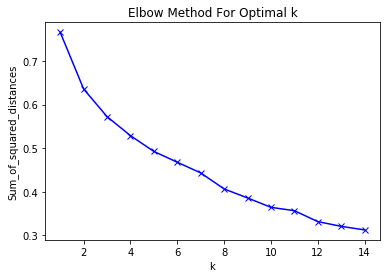

In [67]:
import matplotlib.pyplot as plt

nj_grouped_clustering = nj_grouped.drop('Neighborhood', 1)
Sum_of_squared_distances = []

#determine optimal k 
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(nj_grouped_clustering)
    Sum_of_squared_distances.append(km.inertia_)

plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()    

In [68]:
#Optimal k using elbow method is 5
kclusters = 5
# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(nj_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([1, 2, 3, 4, 0, 4, 1, 2, 1, 3], dtype=int32)

In [71]:
# add clustering labels
nvs = neighborhoods_venues_sorted
nvs.insert(0, 'Cluster Labels', kmeans.labels_)
nj_merged = counties
# merge nj_grouped with counties o add latitude/longitude for each neighborhood
nj_merged = nj_merged.join(nvs.set_index('Neighborhood'), on='Neighborhood')

nj_merged.head() # check the last columns!

ValueError: cannot insert Cluster Labels, already exists

In [72]:
nj_merged.sort_values('Cluster Labels')

,Zip,City,County,AreaCode,Latitude,Longitude,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
45,07042,"Montclair, NJ",Essex,973,40.8131,-74.2165,"Montclair, NJ 07042",0,Pharmacy,Lawyer,Business Service,Health & Beauty Service,Convenience Store,Liquor Store,Home Service,Gift Shop,Cosmetics Shop,Shoe Store
7,07068,"Roseland, NJ",Essex,973,40.8203,-74.3047,"Roseland, NJ 07068",0,Pharmacy,Lawyer,Business Service,Grocery Store,Shipping Store,Shopping Mall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Furniture / Home Store
10,07078,"Short Hills, NJ",Essex,973,40.7368,-74.3271,"Short Hills, NJ 07078",0,Pharmacy,Clothing Store,Furniture / Home Store,Women's Store,Grocery Store,Cosmetics Shop,Liquor Store,Pet Store,Construction & Landscaping,Convenience Store
23,07076,"Scotch Plains, NJ",Union,908,40.6379,-74.3682,"Scotch Plains, NJ 07076",0,Liquor Store,Pharmacy,Grocery Store,Business Service,Convenience Store,Sporting Goods Shop,Kids Store,Construction & Landscaping,Jewelry Store,Supermarket
12,07102,"Newark, NJ",Essex,973,40.7320,-74.1765,"Newark, NJ 07102",0,Lawyer,Business Service,Convenience Store,Home Service,Boutique,Clothing Store,Liquor Store,Pharmacy,Cosmetics Shop,Discount Store
16,07974,"New Providence, NJ",Union,908,40.7004,-74.4023,"New Providence, NJ 07974",0,Liquor Store,Clothing Store,Pharmacy,Construction & Landscaping,Furniture / Home Store,Department Store,Convenience Store,Supermarket,Cosmetics Shop,Business Service
14,07902,"Summit, NJ",Union,908,40.7156,-74.3647,"Summit, NJ 07902",0,Liquor Store,Clothing Store,Furniture / Home Store,Pharmacy,Shoe Store,Cosmetics Shop,Paper / Office Supplies Store,Grocery Store,Gift Shop,Women's Store
11,07207,"Elizabeth, NJ",Union,908,40.6640,-74.2107,"Elizabeth, NJ 07207",0,Lawyer,Convenience Store,Pharmacy,Grocery Store,Clothing Store,Cosmetics Shop,Business Service,Shoe Store,Discount Store,Liquor Store
22,07114,"Newark, NJ",Essex,973,40.7082,-74.1891,"Newark, NJ 07114",0,Business Service,Liquor Store,Convenience Store,Bookstore,Home Service,Discount Store,Electronics Store,Clothing Store,Mobile Phone Shop,Cosmetics Shop
4,07105,"Newark, NJ",Essex,973,40.7271,-74.1563,"Newark, NJ 07105",0,Lawyer,Convenience Store,Liquor Store,Grocery Store,Home Service,Business Service,Pharmacy,Furniture / Home Store,Construction & Landscaping,Cosmetics Shop


In [73]:
nj_merged[nj_merged['Neighborhood']=='Cranford, NJ 07016']

,Zip,City,County,AreaCode,Latitude,Longitude,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
28,07016,"Cranford, NJ",Union,908,40.6554,-74.3057,"Cranford, NJ 07016",2,Pet Store,Pharmacy,Convenience Store,Grocery Store,Home Service,Lawyer,Liquor Store,Clothing Store,Furniture / Home Store,Shipping Store


In [75]:
nj_merged_with_frequency = nj_merged.join(nj_grouped[['Neighborhood', 'Lawyer']].set_index('Neighborhood'), on='Neighborhood')
nj_merged_with_frequency.rename(columns={"Lawyer":"Lawyer Frequency"},inplace=True)

In [76]:
nj_merged_with_frequency.groupby('Cluster Labels')['Lawyer Frequency'].mean()
nj_merged_with_frequency[nj_merged_with_frequency['Cluster Labels']==0]


,Zip,City,County,AreaCode,Latitude,Longitude,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Lawyer Frequency
2,07901,"Summit, NJ",Union,908,40.7149,-74.3642,"Summit, NJ 07901",0,Liquor Store,Clothing Store,Cosmetics Shop,Pharmacy,Furniture / Home Store,Shoe Store,Paper / Office Supplies Store,Grocery Store,Gift Shop,Lawyer,0.03
5,07090,"Westfield, NJ",Union,908,40.6479,-74.3451,"Westfield, NJ 07090",0,Pharmacy,Business Service,Liquor Store,Cosmetics Shop,Convenience Store,Clothing Store,Grocery Store,Boutique,Jewelry Store,Sporting Goods Shop,0.03
11,07207,"Elizabeth, NJ",Union,908,40.6640,-74.2107,"Elizabeth, NJ 07207",0,Lawyer,Convenience Store,Pharmacy,Grocery Store,Clothing Store,Cosmetics Shop,Business Service,Shoe Store,Discount Store,Liquor Store,0.09
14,07902,"Summit, NJ",Union,908,40.7156,-74.3647,"Summit, NJ 07902",0,Liquor Store,Clothing Store,Furniture / Home Store,Pharmacy,Shoe Store,Cosmetics Shop,Paper / Office Supplies Store,Grocery Store,Gift Shop,Women's Store,0.02
16,07974,"New Providence, NJ",Union,908,40.7004,-74.4023,"New Providence, NJ 07974",0,Liquor Store,Clothing Store,Pharmacy,Construction & Landscaping,Furniture / Home Store,Department Store,Convenience Store,Supermarket,Cosmetics Shop,Business Service,0.00
23,07076,"Scotch Plains, NJ",Union,908,40.6379,-74.3682,"Scotch Plains, NJ 07076",0,Liquor Store,Pharmacy,Grocery Store,Business Service,Convenience Store,Sporting Goods Shop,Kids Store,Construction & Landscaping,Jewelry Store,Supermarket,0.01
4,07105,"Newark, NJ",Essex,973,40.7271,-74.1563,"Newark, NJ 07105",0,Lawyer,Convenience Store,Liquor Store,Grocery Store,Home Service,Business Service,Pharmacy,Furniture / Home Store,Construction & Landscaping,Cosmetics Shop,0.09
7,07068,"Roseland, NJ",Essex,973,40.8203,-74.3047,"Roseland, NJ 07068",0,Pharmacy,Lawyer,Business Service,Grocery Store,Shipping Store,Shopping Mall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Furniture / Home Store,0.09
10,07078,"Short Hills, NJ",Essex,973,40.7368,-74.3271,"Short Hills, NJ 07078",0,Pharmacy,Clothing Store,Furniture / Home Store,Women's Store,Grocery Store,Cosmetics Shop,Liquor Store,Pet Store,Construction & Landscaping,Convenience Store,0.01
12,07102,"Newark, NJ",Essex,973,40.7320,-74.1765,"Newark, NJ 07102",0,Lawyer,Business Service,Convenience Store,Home Service,Boutique,Clothing Store,Liquor Store,Pharmacy,Cosmetics Shop,Discount Store,0.11


In [77]:
nj_merged_with_frequency.to_pickle("nj_merged_with_frequency.pickle")